In [1]:
from hidrocomp.series import Flow
import pandas as pd
import plotly as py

In [2]:
flow_sar = Flow(data=pd.read_csv("sar.csv", index_col=0, parse_dates=True))

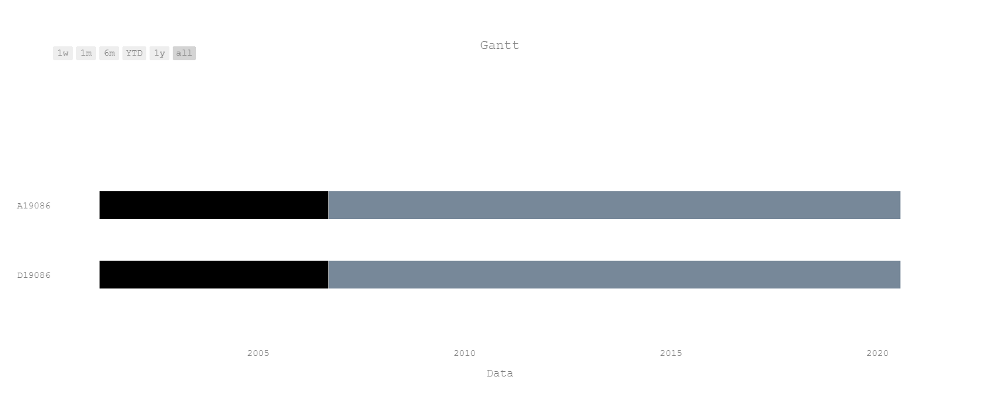

In [3]:
fig_gantt, data_gantt = flow_sar.gantt("Gantt")
py.offline.iplot(fig_gantt)

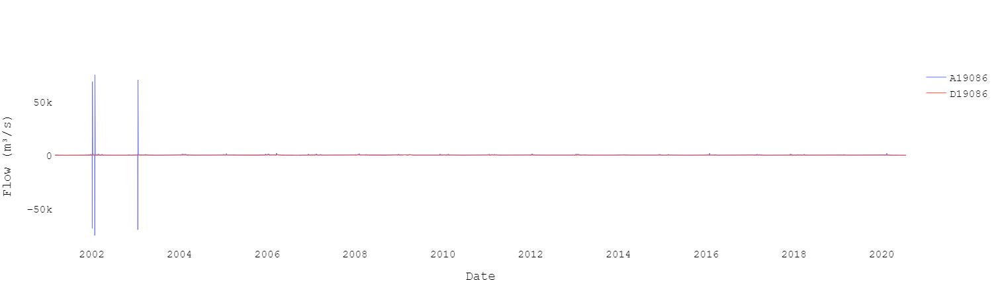

In [4]:
fig_hidro, data_hidro = flow_sar.hydrogram("")
py.offline.iplot(fig_hidro)

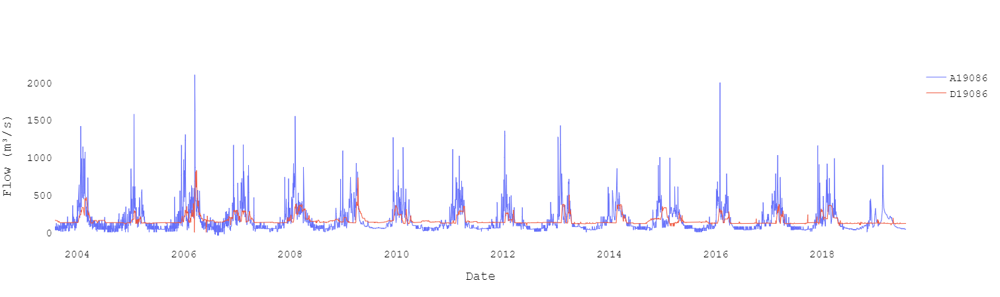

In [5]:
start_period = "01/08/2003"
end_period = "31/07/2019"
flow_sar.date(date_start=start_period, date_end=end_period)
fig_start_filling_hydro, data_start_filling_hydro = flow_sar.hydrogram("")
py.offline.iplot(fig_start_filling_hydro)

In [6]:
nulls = flow_sar.data.isnull()
idx = flow_sar.data.loc[nulls.values == True].index[1:3]
flow_sar.data["D19086"][idx[0]] = 142
flow_sar.data["D19086"][idx[1]] = 141
flow_sar.data["A19086"][idx[0]] = 48
flow_sar.data["A19086"][idx[1]] = 56

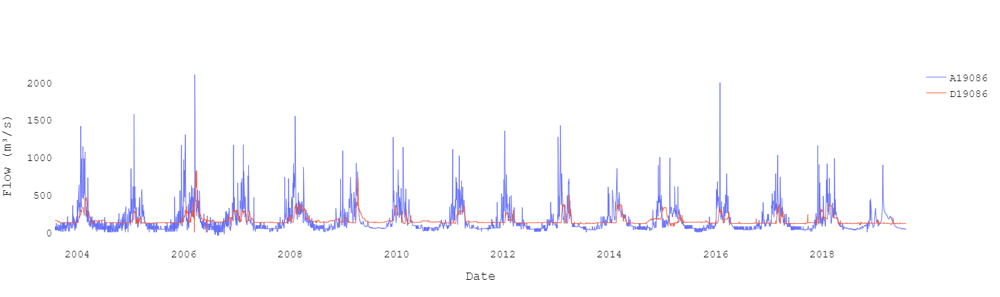

In [7]:
flow_sar.date(date_start=start_period, date_end=end_period)
fig_start_filling_hydro, data_start_filling_hydro = flow_sar.hydrogram("")
py.offline.iplot(fig_start_filling_hydro)

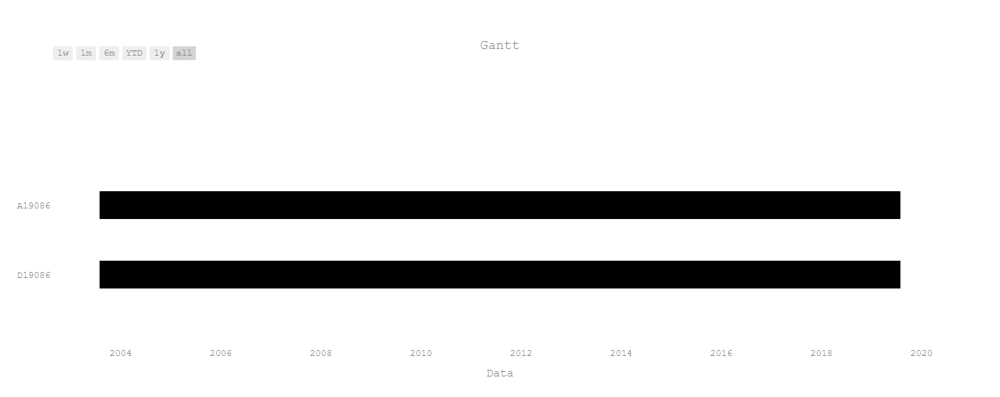

In [8]:
fig_gantt_2, data_gantt_2 = flow_sar.gantt("Gantt")
py.offline.iplot(fig_gantt_2)

Variables:

Magnitude:
- 1-day maximum
- 1-day minimum

Duration:
- High pulse duration
- Low pulse duration

Frequency:
- High pulse count
- Low pulse count

Timing:
- Date of maximum
- Date of minimum

# Control x Impact

In [9]:
flow_pre = Flow(data=flow_sar.data["A19086"].to_frame())

In [10]:
 # q90
threshold_high = flow_pre.quantile(0.75)[0]
f"Threshold high: {threshold_high}"

'Threshold high: 199.0'

In [11]:
# q10
threshold_low = flow_pre.quantile(0.50)[0]
f"Threshold low: {threshold_low}"

'Threshold low: 93.0'

## Manso

In [12]:
iha_pre = flow_pre.iha(status='pre', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [13]:
iha_pre.summary()

,Coeff. of Var.,Means
1-day maximum,452.807378,1243.015882
1-day minimum,16.686296,6.431176
High pulse count,4.358421,11.937500
High pulse duration,3.240117,8.568270
Low pulse count,14.702191,19.176471
Low pulse duration,10.282847,12.627925
Date of maximum,136.855199,122.705882
Date of minimum,34.222133,240.176471


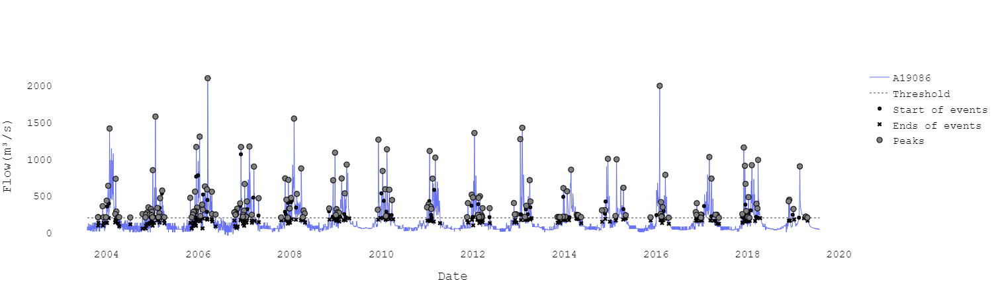

In [14]:
fig_events_high, data_events_high = iha_pre.frequency_and_duration.events_high().plot_hydrogram("")
py.offline.iplot(fig_events_high)

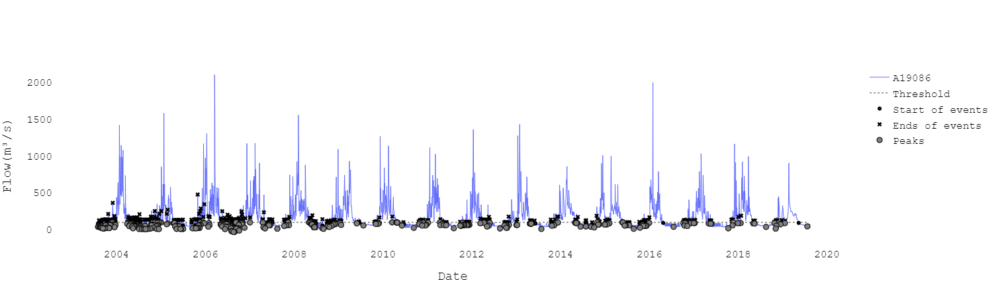

In [15]:
fig_events_low, data_events_low = iha_pre.frequency_and_duration.events_low().plot_hydrogram("")
py.offline.iplot(fig_events_low)

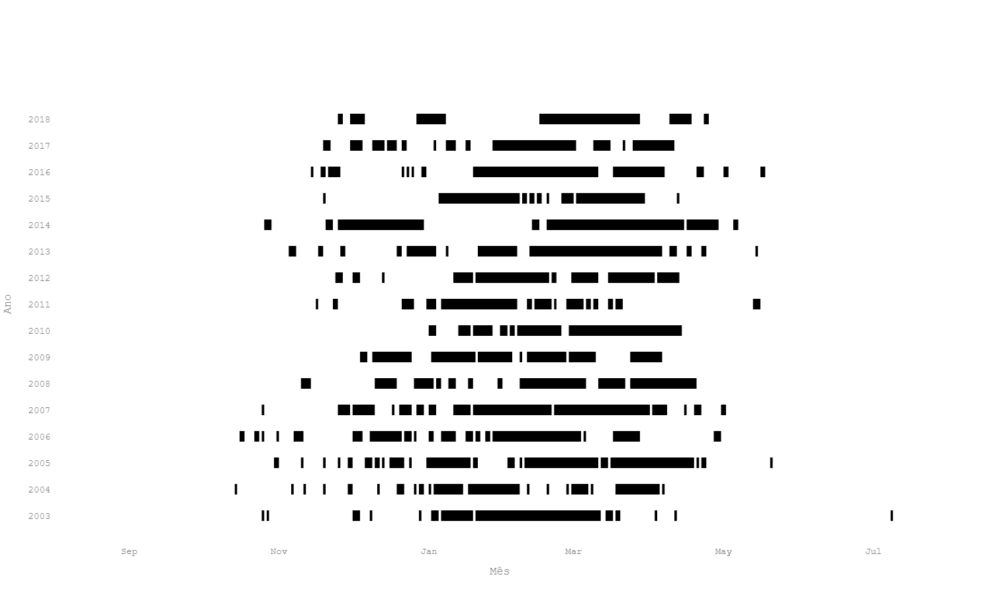

In [16]:
fig_events_high_spells, data_events_high_spells = iha_pre.frequency_and_duration.events_high().plot_spells("")
py.offline.iplot(fig_events_high_spells)

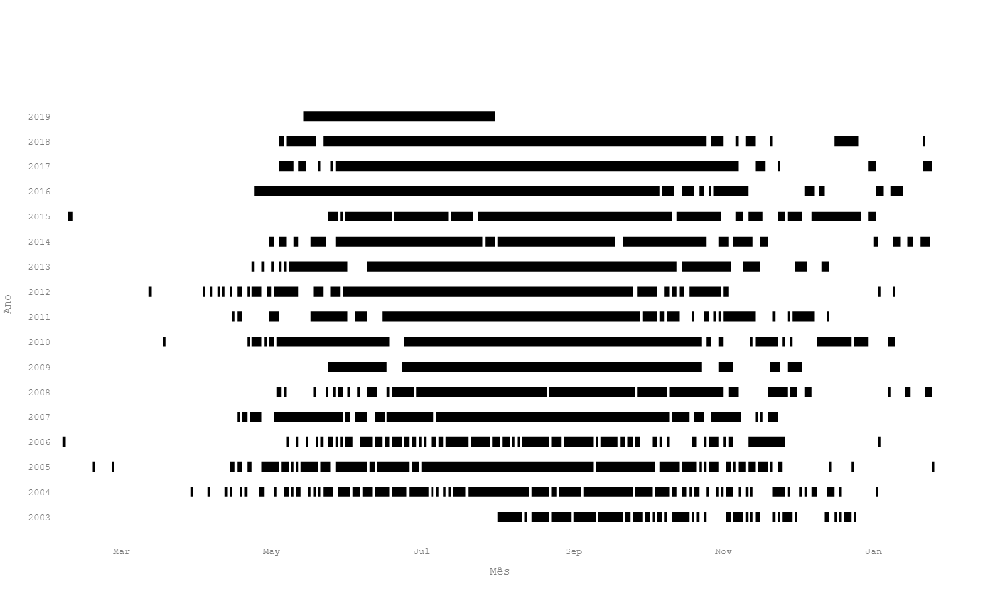

In [17]:
fig_events_low_spells, data_events_low_spells = iha_pre.frequency_and_duration.events_low().plot_spells("")
py.offline.iplot(fig_events_low_spells)

# Observado

In [19]:
flow_obs = Flow(data=flow_sar.data["D19086"].to_frame())

In [20]:
iha_pos = flow_obs.iha(status='pos', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [21]:
iha_pos.summary()

,Coeff. of Var.,Means
1-day maximum,168.513767,389.529412
1-day minimum,30.278001,103.411765
High pulse count,1.770122,2.750000
High pulse duration,18.554887,24.713016
Low pulse count,1.093542,0.437500
Low pulse duration,0.000000,1.000000
Date of maximum,106.009121,110.058824
Date of minimum,100.680515,166.764706


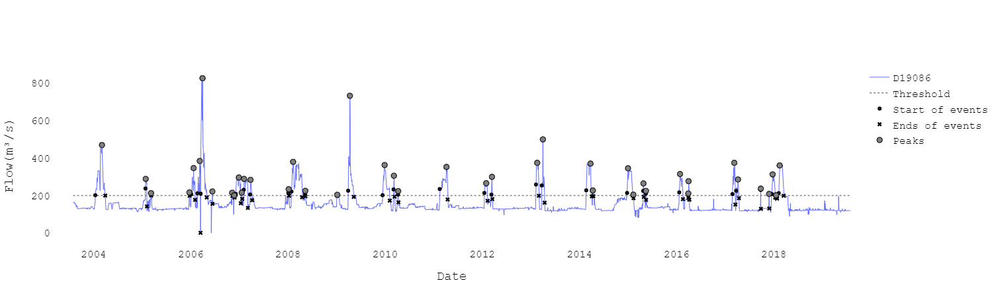

In [22]:
fig_events_high_pos, data_events_high_pos = iha_pos.frequency_and_duration.events_high().plot_hydrogram("")
py.offline.iplot(fig_events_high_pos)

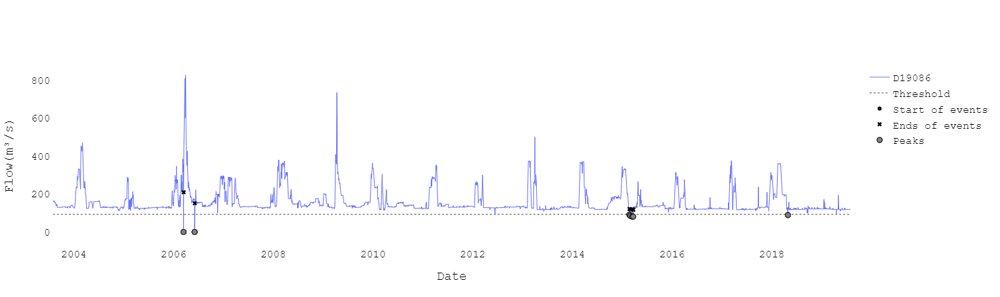

In [23]:
fig_events_low_pos, data_events_low_pos = iha_pos.frequency_and_duration.events_low().plot_hydrogram("")
py.offline.iplot(fig_events_low_pos)

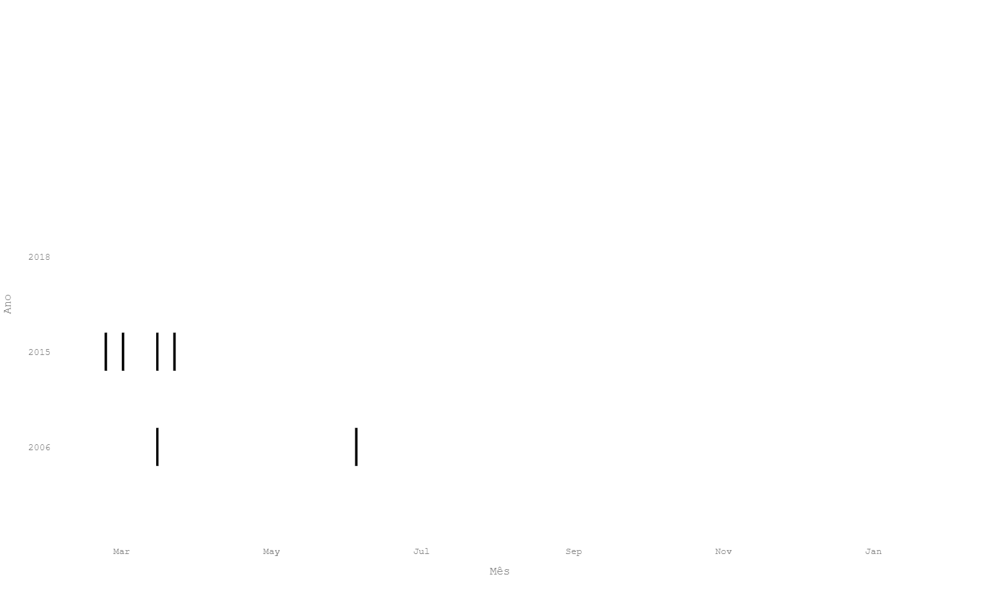

In [24]:
fig_events_low_spells_pos, data_events_low_spells_pos = iha_pos.frequency_and_duration.events_low().plot_spells("")
py.offline.iplot(fig_events_low_spells_pos)

In [25]:
fig_polar_pre_high, data_polar_pre_high = iha_pre.frequency_and_duration.events_high().plot_polar(title="Events High", color="#00008B")
fig_polar_pos_high, data_polar_pos_high = iha_pos.frequency_and_duration.events_high().plot_polar(title="Events High", color="#00008B")

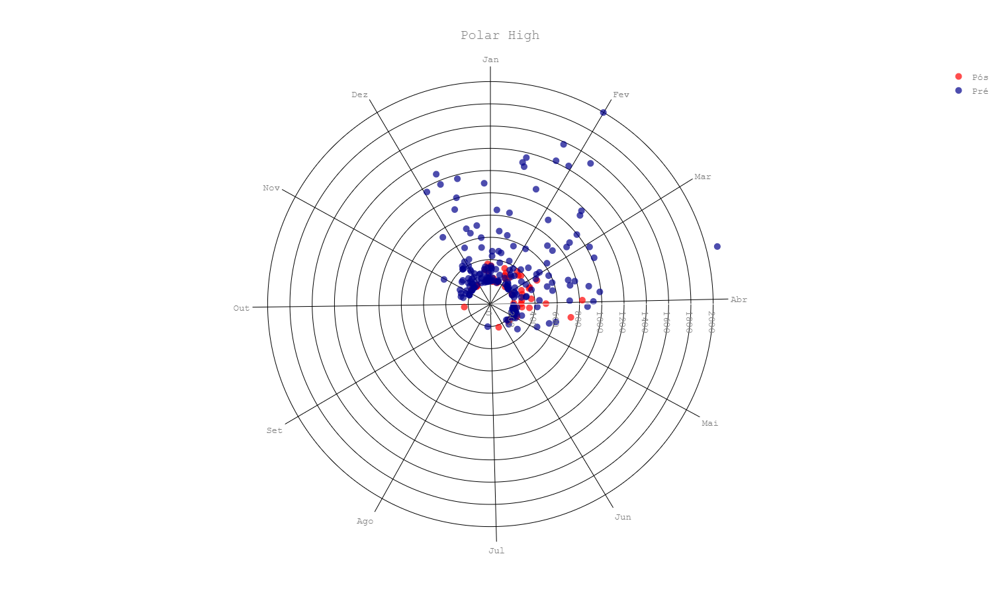

In [26]:
layout=fig_polar_pos_high['layout']

layout['title']['text'] = "Polar High"
data_polar_pos_high[0]['marker']['color'] = "red"
data_polar_pos_high[0]['name'] = "Pós"
data_polar_pre_high[0]['name'] = "Pré"
data_polar_pos_high = dict(data=data_polar_pos_high+[data_polar_pre_high[0]], layout=layout)

py.offline.iplot(data_polar_pos_high)

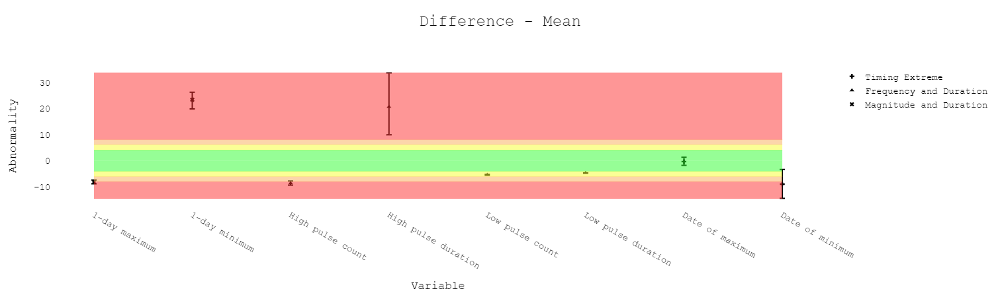

In [27]:
cha = iha_pre.cha(iha_obs=iha_pos)
fig, data = cha.plot(data_type="mean")
py.offline.iplot(fig)